## 3 A. Gabor Filter Bank OpenCV

Gabor filter is implemented using the OpenCV function getGaborKernel using 4 different values for ksize and theta to define filter banks at different scales and orientations.
Then the filter is applied to the grayscale image using OpenCV function filter2D with defined Gabor Kernels. The results after different filters are applied are plotted.


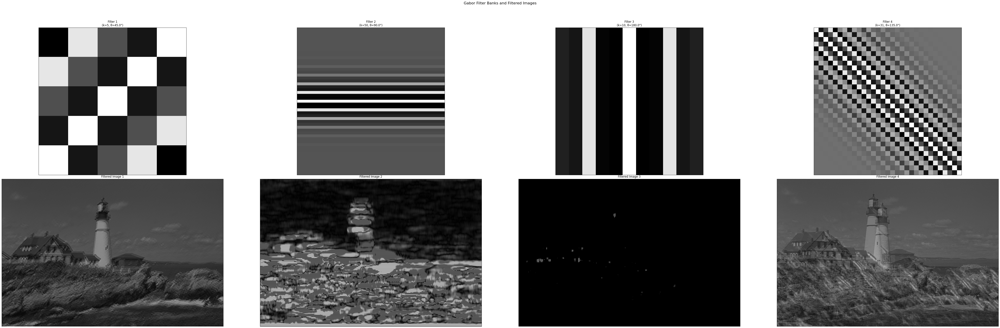

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 

SIGMA = 5
LMBDA = 0.3
GAMMA = 0
PSI = 0

def get_gabor_filter_bank(ksizes, thetas):
    
    filter_bank = cv2.getGaborKernel((ksizes, ksizes), SIGMA, thetas, LMBDA, GAMMA, PSI, ktype=cv2.CV_32F)

    return filter_bank

ksizes = [5, 50, 10, 31]
thetas = [np.pi/4, np.pi/2, np.pi, 3*np.pi/4]

filter_banks = []
for i, ksize in enumerate(ksizes):
    filter_banks.append(get_gabor_filter_bank(ksize, thetas[i]))

def apply_gabor_filter_bank(filter_bank, img):
    
    filter_on_img = cv2.filter2D(img, cv2.CV_8UC3, filter_bank)

    return filter_on_img

grayscale_img = cv2.imread('images/kodim21.png', cv2.IMREAD_GRAYSCALE)

filtered_images = []
for filter_bank in filter_banks:
    filtered_images.append(apply_gabor_filter_bank(filter_bank, grayscale_img))

img_height, img_width = grayscale_img.shape
scale_factor_width = 0.02 # Adjusted to fit 4 images horizontally
scale_factor_height = 0.02 # Adjusted for 2 rows
fig_width = (img_width * 4 * scale_factor_width)
fig_height = (img_height * 2 * scale_factor_height)

plt.figure(figsize=(fig_width, fig_height))
plt.suptitle('Gabor Filter Banks and Filtered Images', fontsize=16)

# Display Filter Banks (First Row)
for i, filter_bank in enumerate(filter_banks):
    plt.subplot(2, 4, i + 1) # 2 rows, 4 columns, current index + 1
    plt.imshow(filter_bank, cmap='gray')
    plt.title(f'Filter {i+1}\n(k={ksizes[i]}, θ={round(np.degrees(thetas[i]), 0)}°)')
    plt.xticks([]), plt.yticks([]) # Hide tick marks

# Display Filtered Images (Second Row)
for i, filtered_img in enumerate(filtered_images):
    plt.subplot(2, 4, i + 5) # 2 rows, 4 columns, current index + 5 (for the second row)
    plt.imshow(filtered_img, cmap='gray')
    plt.title(f'Filtered Image {i+1}')
    plt.xticks([]), plt.yticks([]) # Hide tick marks

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
plt.show()


## 3 B. Gabor Filter Bank using numpy

Gabor filter is implemented without using the OpenCV function and by using numpy using 4 different values for ksize and theta to define filter banks at different scales and orientations.
Then the filter is applied to the grayscale image using custom convolution function. The results after different filters are applied are plotted.

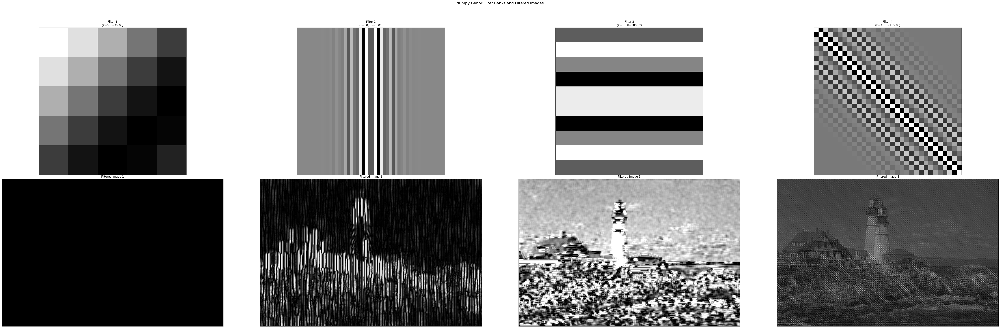

In [2]:
def get_gabor_kernel(ksize, sigma, theta, lambd, gamma, psi):
    y, x = np.meshgrid(np.linspace(-ksize//2, ksize//2, ksize), np.linspace(-ksize//2, ksize//2, ksize))
    
    x_theta = x * np.cos(theta) + y * np.sin(theta)
    y_theta = -x * np.sin(theta) + y * np.cos(theta)
    
    gabor_filter = np.exp(-(x_theta**2 + gamma**2 * y_theta**2) / (2 * sigma**2)) * \
         np.cos(2 * np.pi * x_theta / lambd + psi)
    
    return gabor_filter

gabor_filter_banks = []
for i, ksize in enumerate(ksizes):
    gabor_filter_banks.append(get_gabor_kernel(ksize, SIGMA, thetas[i], LMBDA, GAMMA, PSI))

# Custom 2D convolution method
def convolve2d(image, kernel):
    image_height, image_width = image.shape
    kernel_height, kernel_width = kernel.shape
    
    pad_h = kernel_height // 2
    pad_w = kernel_width // 2
    
    # Pad the image with edge values (or zeros)
    padded_image = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='reflect')
    
    convolved_image = np.zeros_like(image, dtype=np.float32)

    for i in range(image_height):
        for j in range(image_width):
            region = padded_image[i : i + kernel_height, j : j + kernel_width]
            if region.shape == kernel.shape:
                convolved_image[i, j] = np.sum(region * kernel)

    # Clip and convert
    return np.clip(convolved_image, 0, 255).astype(np.uint8)

Gabor_filtered_images = []
for filter_bank in gabor_filter_banks:
    Gabor_filtered_images.append(convolve2d(grayscale_img, filter_bank))
    
img_height, img_width = grayscale_img.shape
scale_factor_width = 0.02 
scale_factor_height = 0.02 
fig_width = (img_width * 4 * scale_factor_width)
fig_height = (img_height * 2 * scale_factor_height)

plt.figure(figsize=(fig_width, fig_height))
plt.suptitle('Numpy Gabor Filter Banks and Filtered Images', fontsize=16)

# Display Filter Banks (First Row)
for i, filter_bank in enumerate(gabor_filter_banks):
    plt.subplot(2, 4, i + 1) # 2 rows, 4 columns, current index + 1
    plt.imshow(filter_bank, cmap='gray')
    plt.title(f'Filter {i+1}\n(k={ksizes[i]}, θ={round(np.degrees(thetas[i]), 0)}°)')
    plt.xticks([]), plt.yticks([]) # Hide tick marks

# Display Filtered Images (Second Row)
for i, filtered_img in enumerate(Gabor_filtered_images):
    plt.subplot(2, 4, i + 5) # 2 rows, 4 columns, current index + 5 (for the second row)
    plt.imshow(filtered_img, cmap='gray')
    plt.title(f'Filtered Image {i+1}')
    plt.xticks([]), plt.yticks([]) # Hide tick marks

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
plt.show() 
    

## C. Leung-Malik Filter Bank 

As part of this task, Leung-Malik filter bank is implemented that contains 48 filters of different scales and orientations. The filter bank is then applied to grayscale image and visualized.

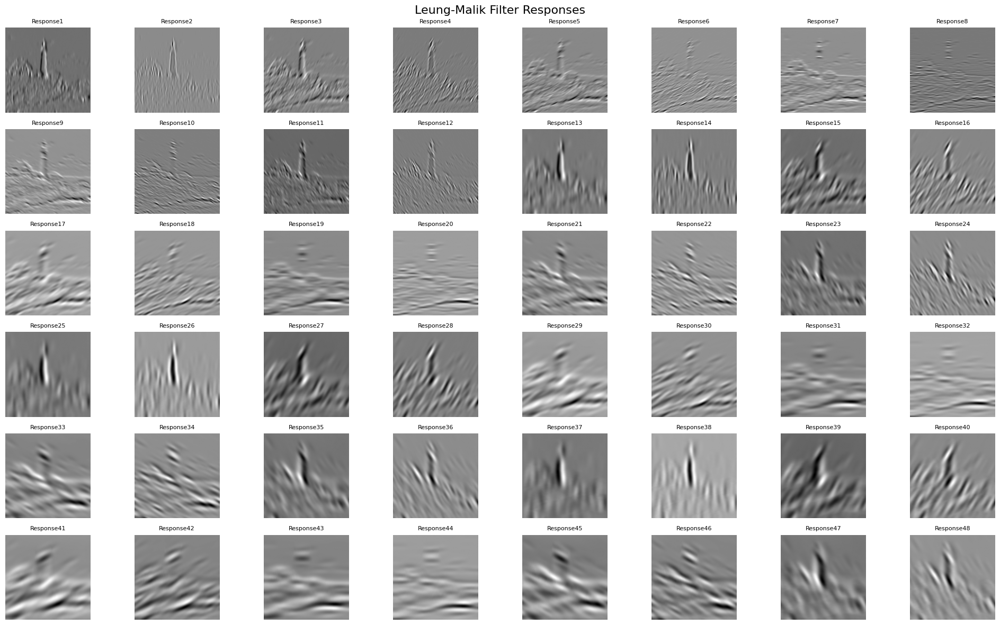

In [3]:

scales = [np.sqrt(2), 2*np.sqrt(2), 3*np.sqrt(2), 4 * np.sqrt(2)]
thetas = [0, np.pi/6, 2*np.pi/6, 3*np.pi/6, 4*np.pi/6, 5*np.pi/6]
filter_size = 49 

def rotated_gaussian_derivative(sigma, order, theta, elongation=3):
    k = filter_size // 2
    y, x = np.mgrid[-k:k+1, -k:k+1]

    x_rot = x * np.cos(theta) + y * np.sin(theta)
    y_rot = -x * np.sin(theta) + y * np.cos(theta)

    sigma_x = sigma
    sigma_y = elongation * sigma

    gaussian = np.exp(-(x_rot**2 / (2*sigma_x**2) + y_rot**2 / (2*sigma_y**2)))

    if order == 1:
        rotated_gaussian = -x_rot / (sigma_x**2) * gaussian
    elif order == 2:
        rotated_gaussian = (x_rot**2 - sigma_x**2) / (sigma_x**4) * gaussian

    rotated_gaussian -= rotated_gaussian.mean()
    
    return rotated_gaussian

def laplacian_of_gaussian(sigma):
    k = filter_size // 2
    y, x = np.mgrid[-k:k+1, -k:k+1]
    gaussian = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    log = ((x**2 + y**2 - 2 * sigma**2) / (sigma**4)) * gaussian
    log -= log.mean()
    return log

def generate_gaussian(sigma):
    k = filter_size // 2
    y, x = np.mgrid[-k:k+1, -k:k+1]
    g = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    g /= g.sum()
    return g

def get_lm_filter_bank():
    filters = []

    # First and second order edge filters (elongated Gaussians)
    for sigma in scales:
        for theta in thetas:
            filters.append(rotated_gaussian_derivative(sigma, order=1, theta=theta))
            filters.append(rotated_gaussian_derivative(sigma, order=2, theta=theta))

    # Symmetric Gaussians (no elongation)
    for sigma in scales:
        filters.append(generate_gaussian(sigma))

    # Laplacian of Gaussians (LoG)
    for sigma in [np.sqrt(2), 2*np.sqrt(2), 3*np.sqrt(2), 4*np.sqrt(2)]:
        filters.append(laplacian_of_gaussian(sigma))
         

    return filters


gray_img = cv2.resize(grayscale_img, (256, 256)).astype(np.float32)

# Generate LM filter bank
lm_filters = get_lm_filter_bank()

# Apply filters
filtered_images = [cv2.filter2D(gray_img, -1, f) for f in lm_filters]


plt.figure(figsize=(20, 12))
for i in range(48):
    plt.subplot(6, 8, i+1)
    plt.imshow(filtered_images[i], cmap='gray')
    plt.axis('off')
    plt.title(f'Response{i+1}', fontsize=8)
plt.suptitle("Leung-Malik Filter Responses", fontsize=16)
plt.tight_layout()
plt.show()